<a href="https://colab.research.google.com/github/farrukhr97/ZTM-Data-Science-Boot-Camp/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Dlassification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub

## 1.Problem
Identifying the breed of the dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog,I want to know what breed of dog it is.
## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3.Evaluation
The evalutaion is a file with prediction probalilities for each dog breed of each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data
* We're dealing with images(unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes)
* There are about 10,000+ images in the training set(these images have labels).
* There are around 10,000+ images in the test set.(these images have no labels,beacuse we'll want to predict them).

In [ ]:
#Unzip the uploaded data into Google Drive.
#!unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub:✅
* Make sure we're using a GPU✅



In [ ]:
#Import tensorflow into Colab
# import tensorflow as tf
# print("TF version:",tf.__version__ )

In [ ]:
#Import necesary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__ )
print("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU","available (YESSSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available:(")

TF version: 2.19.0
TF Hub version: 0.16.1
GPU available (YESSSS!!!!!!)


## Getting our data ready(turning it into Tensors)

With all machine learning models, our data has to be in numerical format.So,that's what we'll be doing first.Turning our images into Tensors (numerical representaions).

Let's start by accessing our data and checking out the labels.

In [ ]:
#Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

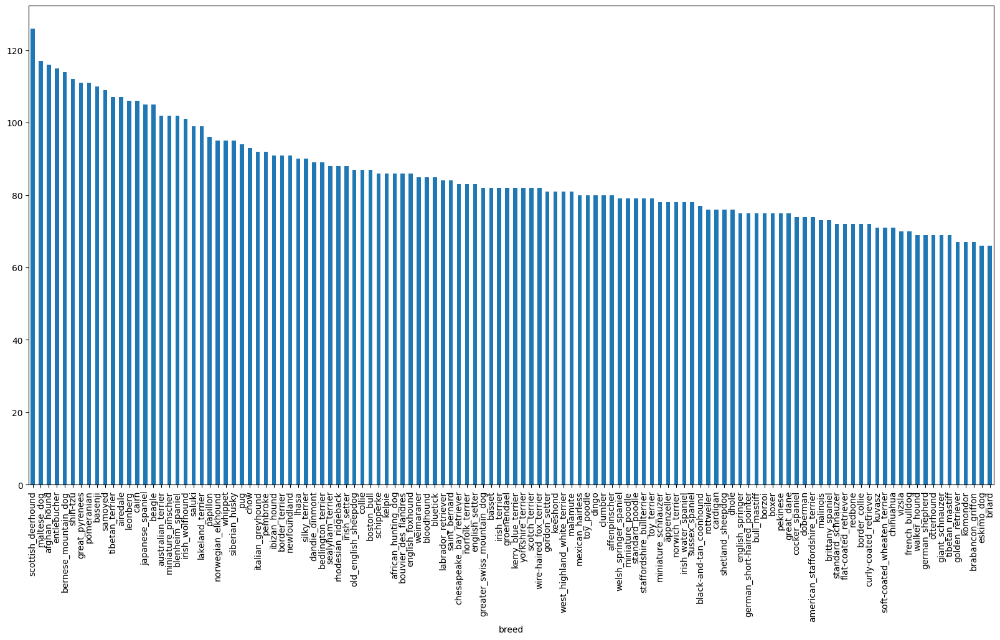

In [ ]:
#How many images there are of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

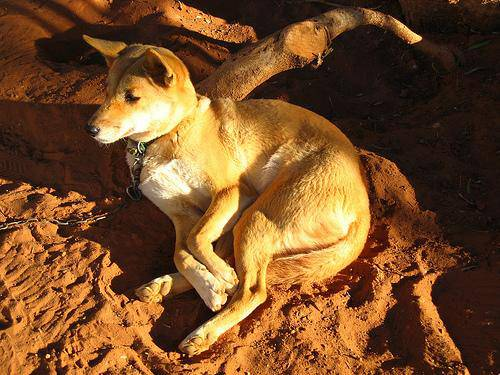

In [ ]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all our image file path names.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create path names from image ID's
filenames=["drive/MyDrive/Dog Vision/train/"+fname+ ".jpg" for fname in labels_csv["id"]]


#Check the first 10
filenames[:10]


['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e3ee6250e25e90f6501f854b27fce20c.jpg',
 'e0c2b69fc53eeb74dfbf31a1ce54b11a.jpg',
 'e5128f2c854ffaa8e53b917edd0741e9.jpg',
 'e387ac130247a8a48e1a136d9a4e013c.jpg',
 'e86503273b282ab18bd09c6b6ef63de7.jpg',
 'dfc726ff7000561805073a11d0d64178.jpg',
 'e42d24760fcb9e6273a29e2f083ba9b6.jpg',
 'e467353f2da5b49fc7a8e9835b22fe0e.jpg',
 'e681969d4b5b730e9c93ce5e9d9ec9ff.jpg',
 'e21bbd2082fe9e256d856c9482aaac8c.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/My Drive/Dog Vision/train/"))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files,check target directory.")

Filenames match actual amount of files!!! Proceed.


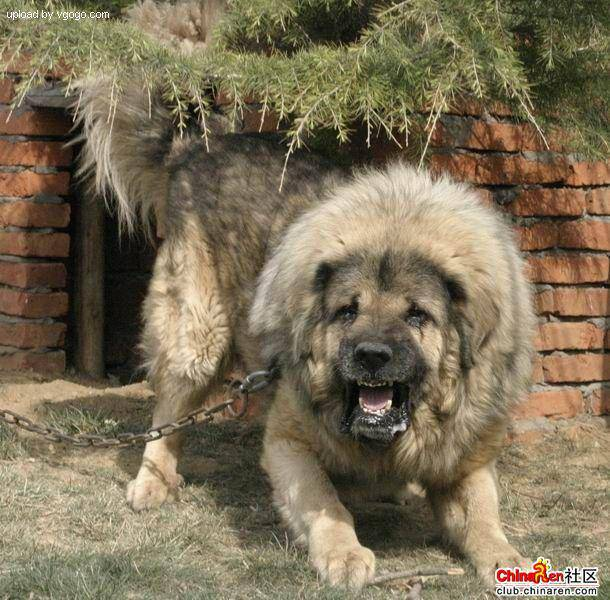

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list,let's prepare our labels.

In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
# labels=np.array(labels) #does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#See if number of labels matches number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match filenames,check data directories!")

Number of labels matches number of filenames!


In [ ]:
#Find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(labels)

10222

In [ ]:
#Turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#Example:Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int))#there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set,we're going to create our own.

In [ ]:
# Setup X & y variables
X=filenames
y=boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES=1000 # @param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
#Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
#Let's have a gaze at training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filespath as input.
2. Use TensorFlow to read the file and save it to variable,`image`
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`

Before we do ,let's see what importing an image looks like

In [ ]:
# Convert an image into NumPy array
from matplotlib.pyplot  import imread
image= imread(filenames[42])
image.shape



(257, 350, 3)

In [ ]:
image.max(),image.min()

(np.uint8(255), np.uint8(0))

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# turn image into a tensor.
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor,let's make a function to preprocess them.

1. Take an image filespath as input.
2. Use TensorFlow to read the file and save it to variable,`image`
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `image`



In [ ]:
# Define image size
IMG_SIZE=224

#Create a funtion for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into Tensor.

  """
  #Read in an image file.
  image=tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colour channels (Red,Green,Blue).
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values 0-255 to 0-1 values.
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go...they all might now fit into memory.

So that's why we do about 32 images (this is the batch size) images at a time
(you can manually adjust the batch size if need be).

In order to use TensorFlow effectivley,we need our data in the form of Tensor tuples which look like this:
`(image,label)`

In [ ]:
#Create a simple funtion to retun a tuple (image,label)
def get_image_label(image_path,label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).

  '''
  image=process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form :`(image,label)`,let's make a function to turn all of our data (`X`,`y`) into batches!

In [ ]:
#Define a batch size,32 is a good start
BATCH_SIZE=32

#Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  '''
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input(no labels).

  '''

 # If a data is a test dataset,we probably don't have test labels
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

 # If the data is the valid dataset,we don't need to shuffle it.
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),   # filepaths
                                             (tf.constant(y)))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                        tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (this also turns the image path into preprocessed image)
    data=data.map(get_image_label)
    #Turn the training  data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
# Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)


Creating training data batches...
Creating validation data batches...


In [ ]:
#Check out different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
y[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Visualizing Data Batches
Our data is now in batches,however,these can be a little hard to understand/comprehend,let's visualize them!


In [ ]:
import matplotlib.pyplot as plt
# Create a funtion for viewing  images in a data bach
def show_25_images(images,labels):
  """
  Displays a  plot of 25 images and their labels from a  data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")





In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

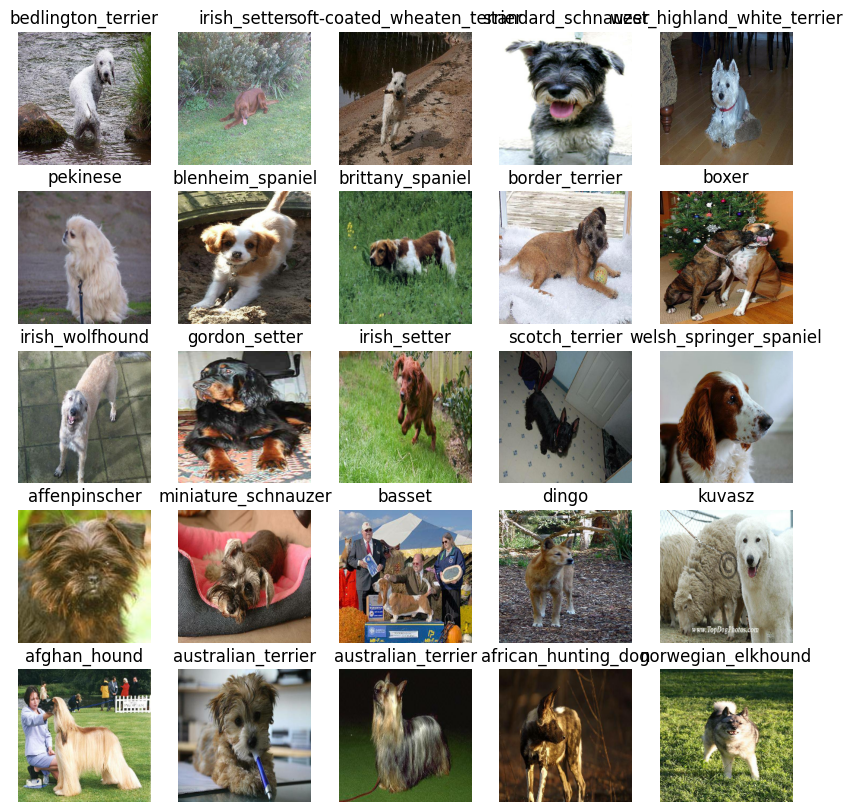

In [ ]:
# Now let's visualize the data in a training  batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

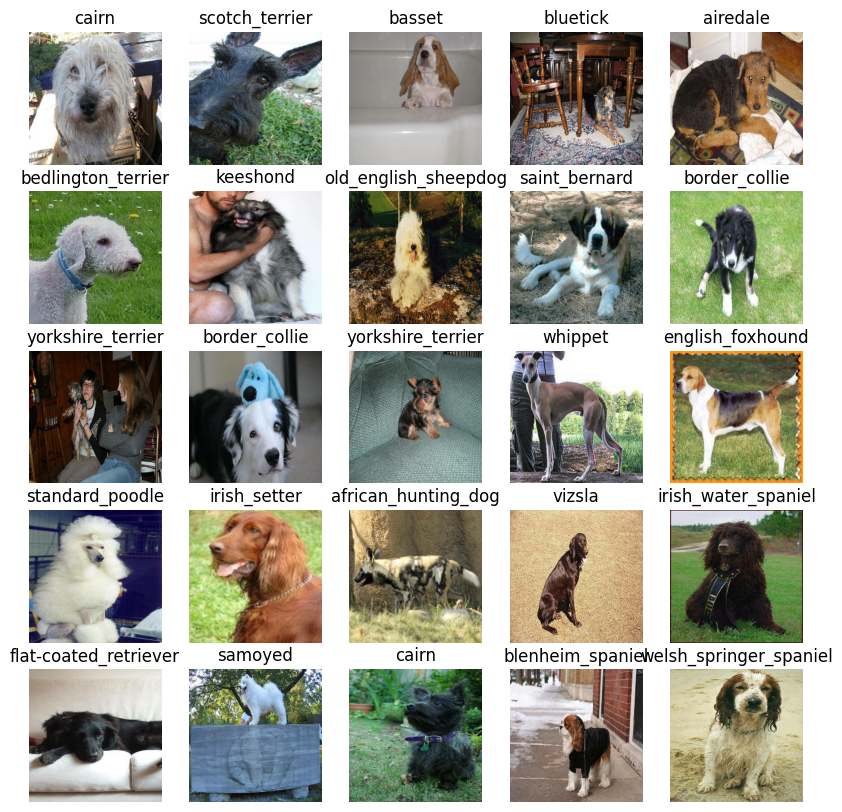

In [ ]:
#Now let's visualize our validation set.
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

Before we build a model,there are few things we need to define:
* The input shape (our images shape,in the form of Tensors) to our model.
* The output shape(image labels,in the form of Tensors)of our model.
* The URL of the model we want to use from TensorFlow Hub-https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification.


In [ ]:
IMG_SIZE

224

In [ ]:
#Setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,colour channels

#Setup output shape of our model.
OUTPUT_SHAPE=len(unique_breeds)
#Setup model URL from TensorFlow Hub
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

Now we've got our inputs,outputs and model ready to go.
Let's put them together into a Keras deep learning model!

Knowing this,let's create a function which:
* Takes the input shape,output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion
(do this first,then this,then that).
* Compiles the mode (says it should be evaluated and improved).
* Builds the model(tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here:https://www.tensorflow.org/guide/keras


In [ ]:
# Create a function that builds a Keras model
import tf_keras as keras
from tf_keras import layers

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  #Setup model layers
  model=keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (input layer)
      keras.layers.Dense(units=OUTPUT_SHAPE,
                           activation="softmax") #Layer 2 (output layer)
    ])
  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
)
  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model=create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving.

We'll create two callbacks,one for TensorBoard which helps track our models progress and another for early stopping which prevents our model for training for too long.

### TensorBoard Callback

To setup a TensorBoard callback,we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we will do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",
                      # Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard


In [ ]:
# Create early stopping callback
early_stopping=keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model (on subset of data)

Our first model is  only going to train on 1000 images,to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU","available (YESSS!!!!!!!)" if tf.config.list_physical_devices("GPU")else "not available :(")

GPU available (YESSS!!!!!!!)


Let's create a funtion which trains a model.

*  Create a model using `create_model()`
*  Setup a TensorBoard callback using `create_tensorboard_callback()`
*  Call the `fit()`function on our model passing it the training data,validation data,number of epochs to train for (`NUM_EPOCHS`) and the call callbacks we'd like to use.
* Return the model.



In [ ]:
# Build a function to build and train and return trained model
def train_model():
  """

  Trains a given model and returns the trained version.
  """
  # Create a model
  model=create_model()

  # Create new TensorBoard session every time we train a model
  tensorboard=create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping]
            )
  #Return the fitted model
  return model





In [ ]:
# Fit the model to the data
model=train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 [==============================] - 154s 6s/step - loss: 4.6027 - accuracy: 0.0775 - val_loss: 3.4826 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 3s 129ms/step - loss: 1.6322 - accuracy: 0.6787 - val_loss: 2.2663 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 129ms/step - loss: 0.5791 - accuracy: 0.9300 - val_loss: 1.7741 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 167ms/step - loss: 0.2564 - accuracy: 0.9887 - val_loss: 1.5819 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1483 - accuracy: 0.9987 - val_loss: 1.4944 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1001 - accuracy: 1.0000 - val_loss: 1.4570 - val_accuracy: 0.6500
Epoch 7/100
25/25 [================

**Question:**It looks like our model is overfitting because it's performing far better on training dataset than the validation dataset,what are some ways to prevent model overfitting in deep learning neural networks?
https://www.kaggle.com/discussions/general/175912
**Note** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TenosorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# Making and evaluating predictions using a trained model


In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on validation data(not used to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 35s 5s/step


array([[0.0020679 , 0.00224156, 0.00043403, ..., 0.00026732, 0.00109661,
        0.00058004],
       [0.00232293, 0.00942807, 0.00181129, ..., 0.01279428, 0.0063189 ,
        0.00429576],
       [0.00051762, 0.00136822, 0.00063729, ..., 0.00130874, 0.00018071,
        0.00235758],
       ...,
       [0.00764119, 0.00027247, 0.00056693, ..., 0.01450895, 0.00072533,
        0.00163938],
       [0.00622455, 0.00761324, 0.00255912, ..., 0.00687994, 0.00479377,
        0.00218186],
       [0.00695893, 0.0011425 , 0.00891083, ..., 0.00070222, 0.00496837,
        0.03050459]], dtype=float32)

In [ ]:
np.sum(predictions[0])

np.float32(0.99999994)

In [ ]:
# First prediction
index=0
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.06790050e-03 2.24155700e-03 4.34030459e-04 2.54949392e-03
 2.62986543e-03 2.23831763e-03 5.19569207e-04 7.18244119e-03
 4.78808582e-03 3.81446094e-03 4.14072187e-04 3.91059043e-03
 1.82247651e-03 1.73708738e-03 2.23518955e-03 4.40486670e-02
 2.16553174e-03 3.51760862e-03 1.28547754e-02 6.53078489e-04
 7.30371859e-04 1.23450365e-02 2.16487935e-03 9.00130835e-04
 4.82667354e-04 6.35699416e-03 4.58285995e-02 2.65548355e-03
 2.04071286e-04 6.17797923e-05 3.98512697e-03 5.39864507e-03
 1.87747441e-02 3.38262157e-03 8.24606614e-05 3.36288963e-03
 2.22563767e-03 3.02387355e-03 6.96991454e-04 1.66683493e-03
 4.35863039e-04 1.73011590e-02 7.53462967e-03 1.98586425e-03
 3.26633155e-02 4.29076934e-03 1.79105368e-03 3.64482612e-03
 5.07792570e-02 1.45432889e-03 1.01688982e-03 9.37388628e-04
 5.94445970e-03 1.36493205e-03 2.02068547e-03 2.66786036e-03
 1.38215860e-03 5.74051228e-04 7.54869077e-04 2.13936381e-02
 1.66826212e-04 4.17991076e-03 1.48065924e-03 2.17390573e-03
 7.62471417e-03 2.097860

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note** Prediction probabilites are also known as confidence levels.

In [ ]:
# Turn prediction probabilites into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label


'rhodesian_ridgeback'

Now since our validation data is still in a batch dataset,we'll have to unbachify it to make predictions on the validation images and then compare those predictions to validation labels(truth labels).

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels.
  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]




(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images_=[]
labels_=[]

# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0],labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
*  Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities,an array of truth labels and an array of images and an integer.✅
* Convert the prediciton probabilities to a predicted label.✅
* Plot the predicted label,its predicted probability,the truth label and the target image on a single plot.✅


In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction,ground truth and image for sample n
  """
  pred_prob, true_label, image=prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label ==true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                  np.max(pred_prob)*100,
                                  true_label),
                                  color=color)


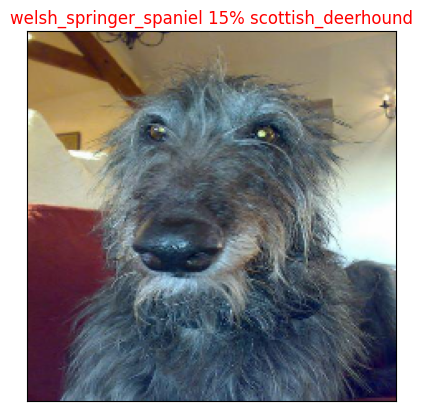

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=25)

Now we've got one function to visualize our models top prediction, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer✅
* Find the prediction using `get_pred_label()`✅
* Find the top 10:
* Prediction probabilities indexes✅
* Prediction probabilities values✅
* Prediction labels✅
* Plot the top 10 prediction probability values and labels,coloring the true label green✅





In [ ]:
def  plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)
  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels== true_label)].set_color("green")
  else:
    pass

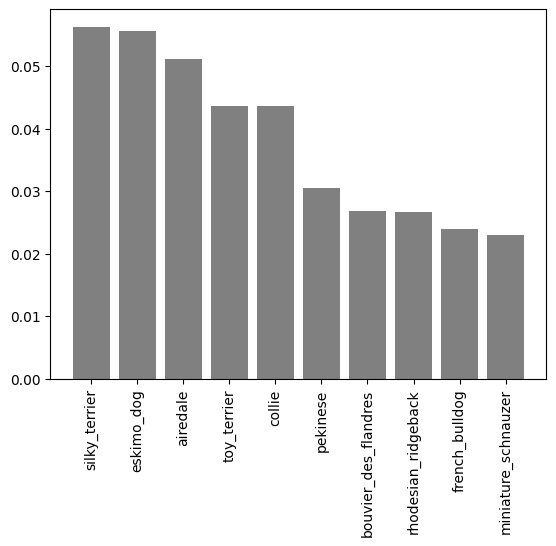

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [ ]:
predictions[0]

array([2.06790050e-03, 2.24155700e-03, 4.34030459e-04, 2.54949392e-03,
       2.62986543e-03, 2.23831763e-03, 5.19569207e-04, 7.18244119e-03,
       4.78808582e-03, 3.81446094e-03, 4.14072187e-04, 3.91059043e-03,
       1.82247651e-03, 1.73708738e-03, 2.23518955e-03, 4.40486670e-02,
       2.16553174e-03, 3.51760862e-03, 1.28547754e-02, 6.53078489e-04,
       7.30371859e-04, 1.23450365e-02, 2.16487935e-03, 9.00130835e-04,
       4.82667354e-04, 6.35699416e-03, 4.58285995e-02, 2.65548355e-03,
       2.04071286e-04, 6.17797923e-05, 3.98512697e-03, 5.39864507e-03,
       1.87747441e-02, 3.38262157e-03, 8.24606614e-05, 3.36288963e-03,
       2.22563767e-03, 3.02387355e-03, 6.96991454e-04, 1.66683493e-03,
       4.35863039e-04, 1.73011590e-02, 7.53462967e-03, 1.98586425e-03,
       3.26633155e-02, 4.29076934e-03, 1.79105368e-03, 3.64482612e-03,
       5.07792570e-02, 1.45432889e-03, 1.01688982e-03, 9.37388628e-04,
       5.94445970e-03, 1.36493205e-03, 2.02068547e-03, 2.66786036e-03,
      

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.15470336, 0.05232912, 0.05077926, 0.0458286 , 0.04404867,
       0.03877175, 0.03266332, 0.03197185, 0.02886211, 0.02777308],
      dtype=float32)

In [ ]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['miniature_pinscher', 'tibetan_mastiff', 'giant_schnauzer',
       'cairn', 'bluetick', 'welsh_springer_spaniel',
       'flat-coated_retriever', 'saint_bernard', 'miniature_schnauzer',
       'miniature_poodle'], dtype=object)

Now we've got some function to help us visualize our predictions and evaluate our model,let's check out a few.


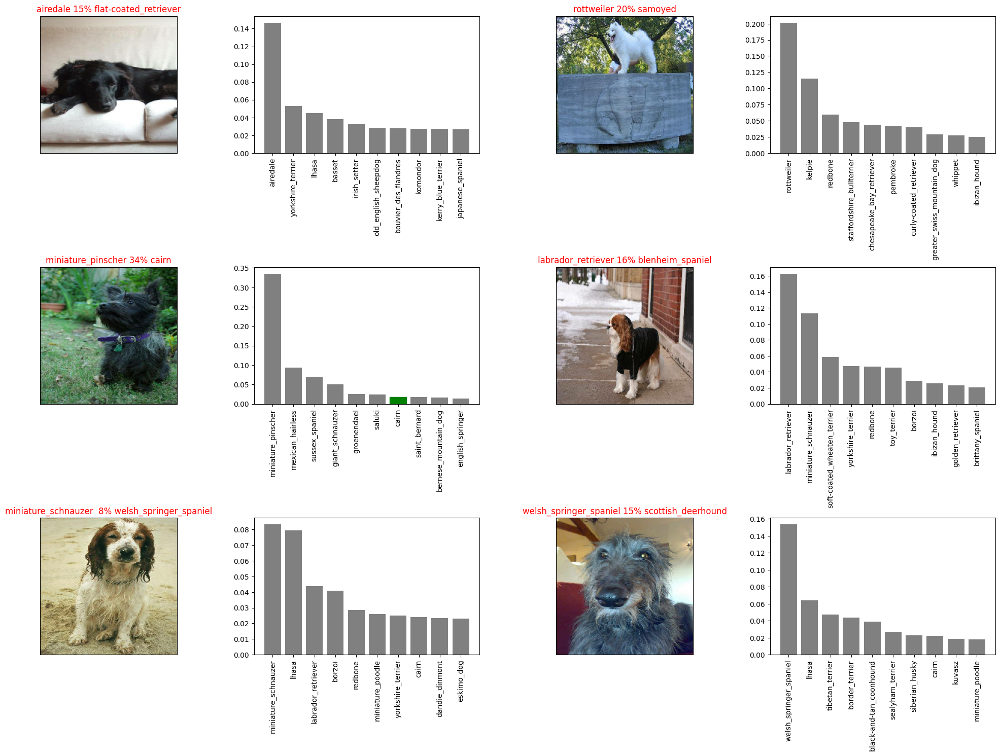

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier=20
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
             n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge**
How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  # Create a model directory pathname  with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-"+suffix+".h5" #save format of models
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path



In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")
  model=keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model



Now we've got a functions to save and load a trained model,let's make sure they work

In [ ]:
# Save a model trained on 1000 images
save_model(model,suffix="1000-image-mobilenetv2-Adam")

NameError: name 'save_model' is not defined

In [ ]:
# Load a trained model
loaded_1000_image_model=load_model('drive/MyDrive/Dog Vision/models/20250902-20241756844686-1000-image-mobilenetv2-Adam.h5')

Loading saved model from:drive/MyDrive/Dog Vision/models/20250902-20241756844686-1000-image-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 89ms/step - loss: 5.9105 - accuracy: 0.0050


[5.910478591918945, 0.004999999888241291]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 92ms/step - loss: 0.1532 - accuracy: 0.9750


[0.15318775177001953, 0.9750000238418579]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X_train)

800

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set when training on all the data,so we can't monitor validation accuracy
full_model_early_stopping=keras.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3)

**Note:** Running the cell below will take the little while (maybe upto 30 minutes for first epoch) because the GPU we're using in the runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100


KeyboardInterrupt: 

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
# Load in the full model
loaded_full_model=load_model('drive/MyDrive/Dog Vision/models/20250911-22321757629949-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from:drive/MyDrive/Dog Vision/models/20250911-22321757629949-full-image-set-mobilenetv2-Adam.h5


In [ ]:
len(X)

10222

In [ ]:
len(X)

10222

## Making predictions on test dataset

Since our model has been trained on images in the form of Tensor batches,to make predictions on the test data,we'll have to get it into same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on test data,we'll:
* Get the test image file names.✅
* Convert the filenames into test data batches using `create_data_batches()` and
setting the `test data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()`method called on our model.

In [ ]:
# Load test image filenames
test_path="drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 'drive/MyDrive/Dog Vision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/Dog Vision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/MyDrive/Dog Vision/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 'drive/MyDrive/Dog Vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/Dog Vision/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg',
 'drive/MyDrive/Dog Vision/test/e5b8269cbd9b417dd00e8661206b91ff.jpg',
 'drive/MyDrive/Dog Vision/test/e08d42b2e6f2dbcf24c6bfee8b7d03bd.jpg',
 'drive/MyDrive/Dog Vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data= create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 1664s 5s/step


In [ ]:
# Save predictions (NumPy array) to csv  file (for  access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv files
test_predictions=np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.99170445e-11, 2.12614626e-12, 1.10057040e-10, ...,
        3.57295953e-08, 1.52556995e-11, 2.59542856e-11],
       [2.38336151e-09, 4.64996236e-11, 8.32000246e-09, ...,
        5.51769161e-04, 2.34187389e-08, 5.43856373e-08],
       [6.54692988e-13, 4.29253450e-05, 2.04543493e-10, ...,
        4.12756984e-09, 3.11268344e-09, 8.75016892e-10],
       ...,
       [9.67403761e-12, 1.00871089e-08, 2.37439617e-11, ...,
        4.77610285e-10, 4.36777498e-07, 2.55593685e-10],
       [2.81106603e-14, 9.99988198e-01, 6.54422653e-12, ...,
        1.70676562e-09, 2.82507906e-10, 2.49371901e-09],
       [1.17803432e-11, 7.47862189e-12, 2.06166573e-12, ...,
        6.08042150e-09, 2.82703166e-10, 2.56134979e-12]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission,we find that it wants our models prediction probability outputs in a DataFrame with an ID column and a column for each different dog breed.https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format,we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.✅
* Add data to the ID column by extracting test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of dog breed columns.
* Export a DataFrame as a CSV to submit it to Kaggle.

In [ ]:
#["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df=pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_filenames

['drive/MyDrive/Dog Vision/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 'drive/MyDrive/Dog Vision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/Dog Vision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/MyDrive/Dog Vision/test/e2844bf76c0ddeae02277d76c31e41f5.jpg',
 'drive/MyDrive/Dog Vision/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 'drive/MyDrive/Dog Vision/test/e193c532dc7c9a5ee397848a1ee007f0.jpg',
 'drive/MyDrive/Dog Vision/test/e089aa32bc96c2a9753e7a5fcdc1bac9.jpg',
 'drive/MyDrive/Dog Vision/test/e5b8269cbd9b417dd00e8661206b91ff.jpg',
 'drive/MyDrive/Dog Vision/test/e08d42b2e6f2dbcf24c6bfee8b7d03bd.jpg',
 'drive/MyDrive/Dog Vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg',
 'drive/MyDrive/Dog Vision/test/e76a7a1d23d687b5015b07df762c0c10.jpg',
 'drive/MyDrive/Dog Vision/test/efdd2006f173de50417a1a9ee170194b.jpg',
 'drive/MyDrive/Dog Vision/test/e967dd3dc67352cc2525c8283bf2751d.jpg',
 'drive/MyDrive/Dog Vision/test/f4a2ee1dd5542da8b0150fe8f7a2b7c3.jpg',
 'driv

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1444b7c629f6775432269bfd9c7e758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e66eb9532985301394e1bfb8f05206d4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dfac7db18136057f5d1730c0055f875c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2844bf76c0ddeae02277d76c31e41f5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e76a58909e6e1196bdefb3105060bcbe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e1444b7c629f6775432269bfd9c7e758,2.991704e-11,2.126146e-12,1.100570e-10,4.109311e-10,8.535471e-08,8.418939e-05,1.849246e-10,2.525617e-07,1.304294e-08,...,3.575467e-09,3.127010e-10,4.673115e-10,1.417479e-07,1.020221e-09,2.435932e-09,6.766688e-10,3.572960e-08,1.525570e-11,2.595429e-11
1,e66eb9532985301394e1bfb8f05206d4,2.383362e-09,4.649962e-11,8.320002e-09,1.824229e-08,8.155503e-01,1.012458e-10,2.427390e-07,7.434923e-03,2.728263e-04,...,1.413951e-06,7.335083e-09,1.515510e-06,4.452741e-08,1.364792e-06,8.955323e-07,1.737145e-09,5.517692e-04,2.341874e-08,5.438564e-08
2,dfac7db18136057f5d1730c0055f875c,6.546930e-13,4.292535e-05,2.045435e-10,6.514122e-07,1.078515e-09,2.188671e-10,9.715972e-10,5.699744e-10,1.514160e-08,...,1.131231e-10,1.308581e-10,6.160646e-05,2.640503e-06,2.753547e-10,5.138710e-11,1.105551e-13,4.127570e-09,3.112683e-09,8.750169e-10
3,e2844bf76c0ddeae02277d76c31e41f5,3.021371e-13,3.746592e-16,1.156341e-15,5.140363e-15,6.382486e-12,2.849825e-10,2.386357e-13,2.387402e-10,1.687335e-10,...,9.986450e-09,7.659390e-05,3.544175e-14,4.705252e-16,2.564051e-10,4.560165e-12,3.524915e-14,8.449843e-06,5.863720e-11,4.950492e-09
4,e76a58909e6e1196bdefb3105060bcbe,1.398370e-10,1.713054e-10,1.751083e-11,1.934215e-10,1.069468e-12,4.522485e-07,5.553199e-13,2.762489e-07,2.331420e-12,...,1.228901e-11,5.343127e-10,6.092738e-10,2.737055e-11,5.200939e-10,3.604712e-12,5.271420e-13,4.777513e-10,9.890254e-12,1.563278e-12


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

# Making predictions on custom images

To make predictions on custom images,we'll:
* Get filepaths of our own images
* Turn the filepaths into data batches using `create_data_batches()`.And since our custom won't have labels, we set the `test_data`parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to custom images.



In [ ]:
# Get custom image filepaths
custom_path="drive/My Drive/Dog Vision/my-dog-photos/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/My Drive/Dog Vision/my-dog-photos/dog-photo-3.jpeg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-photo-4.jpeg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-photo-2.jpeg',
 'drive/My Drive/Dog Vision/my-dog-photos/dog-photo-1.jpeg']

In [ ]:
os.listdir(custom_path)

['dog-photo-3.jpeg',
 'dog-photo-4.jpeg',
 'dog-photo-2.jpeg',
 'dog-photo-1.jpeg']

In [ ]:
# Turn custom images into batch dataset
custom_data=create_data_batches(custom_image_paths, test_data=True)
custom_data


Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)


1/1 [==============================] - 1s 1s/step


In [ ]:
custom_preds.shape

(4, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever',
 'miniature_pinscher',
 'lakeland_terrier',
 'golden_retriever']

In [ ]:
# Get custom images(our unbatchify() function won't work since there aren't labels...maybe we could fix this later)
custom_images=[]
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

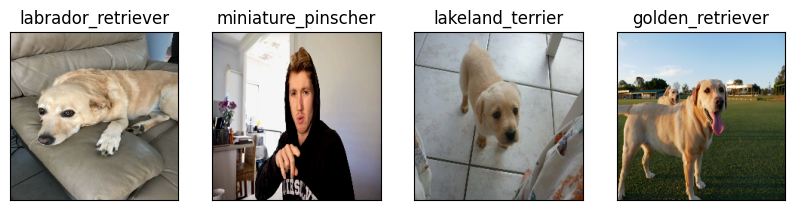

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)